### Understanding the Effects of Anthropogenic Forces on Global Warming

In [ ]:
#install the following packages
# %pip install statsmodels plotly seaborn scikit-learn pmdarima
#pmdarima is a package that helps to find the best ARIMA model for time series data

In [1]:
# import packages needed for this project
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import sklearn
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
# from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.vector_ar.vecm import VECM
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.stattools import grangercausalitytests
import plotly
import statsmodels.api as sm
from pmdarima import model_selection
import pmdarima as pm
import prophet
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
%matplotlib inline
sm.tsa.statespace.SARIMAX
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
os.getcwd()

'c:\\Users\\musta\\Project_Temp\\data'

## Loading the Temperature data

The HadCRUT5 near surface temperature dataset used in this study consist of blended data from CRUTEM5 surface air temperature dataset and HadSST4 sea-surface temperature dataset.  
The time series are best estimates computed as means of regional time series computed for each of 200 ensemble member realisations. They are presented as temperature anomalies (deg C) relative to 1961 - 1990. More about the dataset can be found here:  https://www.metoffice.gov.uk/hadobs/hadcrut5/data/current/download.html  


In [191]:
#load the annual and monthly temperature data
temperature_annual_df = pd.read_csv('temperature/HadCRUT.5.0.1.0.analysis.summary_series.global.annual.csv')
temperature_monthly_df = pd.read_csv('temperature/HadCRUT.5.0.1.0.analysis.summary_series.global.monthly.csv')

In [192]:
#check for missing values 
print(f'Yearly data: The number of missing values in {[i for i in temperature_annual_df.columns]} are:\n {[i for i in temperature_annual_df.isnull().sum()]} respectively\n')
print(f'Monthly data: The number of missing values in {[i for i in temperature_monthly_df.columns]} are:\n {[i for i in temperature_monthly_df.isnull().sum()]} respectively')

Yearly data: The number of missing values in ['Time', 'Anomaly (deg C)', 'Lower confidence limit (2.5%)', 'Upper confidence limit (97.5%)'] are:
 [0, 0, 0, 0] respectively

Monthly data: The number of missing values in ['Time', 'Anomaly (deg C)', 'Lower confidence limit (2.5%)', 'Upper confidence limit (97.5%)'] are:
 [0, 0, 0, 0] respectively


In [193]:
#first 5 rows of the annual temperature data
temperature_annual_df.head()

,Time,Anomaly (deg C),Lower confidence limit (2.5%),Upper confidence limit (97.5%)
0,1850,-0.417659,-0.589203,-0.246115
1,1851,-0.233350,-0.411868,-0.054832
2,1852,-0.229399,-0.409382,-0.049416
3,1853,-0.270354,-0.430009,-0.110700
4,1854,-0.291630,-0.432824,-0.150436


**Rename some columns, set index, etc:**

In [194]:
#change the time column to datetime for only year
temperature_annual_df['Date'] = temperature_annual_df['Time']
#rename the Time column to Year
temperature_annual_df = temperature_annual_df.rename(columns={'Time':'Year', 'Anomaly (deg C)':'Anomaly'})
#set the Date column as the index
temperature_annual_df.set_index('Date', inplace=True)

temperature_annual_df.head()

,Year,Anomaly,Lower confidence limit (2.5%),Upper confidence limit (97.5%)
Date,,,,
1850,1850,-0.417659,-0.589203,-0.246115
1851,1851,-0.233350,-0.411868,-0.054832
1852,1852,-0.229399,-0.409382,-0.049416
1853,1853,-0.270354,-0.430009,-0.110700
1854,1854,-0.291630,-0.432824,-0.150436


In [195]:
#first 5 rows of the monthly temperature data
temperature_monthly_df.head()

,Time,Anomaly (deg C),Lower confidence limit (2.5%),Upper confidence limit (97.5%)
0,1850-01,-0.674564,-0.981772,-0.367357
1,1850-02,-0.333416,-0.700901,0.034069
2,1850-03,-0.591323,-0.933919,-0.248726
3,1850-04,-0.588721,-0.898259,-0.279183
4,1850-05,-0.508185,-0.761214,-0.255157


In [196]:
#change the Time column of the monthly data to datetime and set it as the index
temperature_monthly_df['Date'] = pd.to_datetime(temperature_monthly_df['Time'])
temperature_monthly_df.set_index('Date', inplace=True)
temperature_monthly_df.head()

,Time,Anomaly (deg C),Lower confidence limit (2.5%),Upper confidence limit (97.5%)
Date,,,,
1850-01-01,1850-01,-0.674564,-0.981772,-0.367357
1850-02-01,1850-02,-0.333416,-0.700901,0.034069
1850-03-01,1850-03,-0.591323,-0.933919,-0.248726
1850-04-01,1850-04,-0.588721,-0.898259,-0.279183
1850-05-01,1850-05,-0.508185,-0.761214,-0.255157


## Exploratory Data Analysis

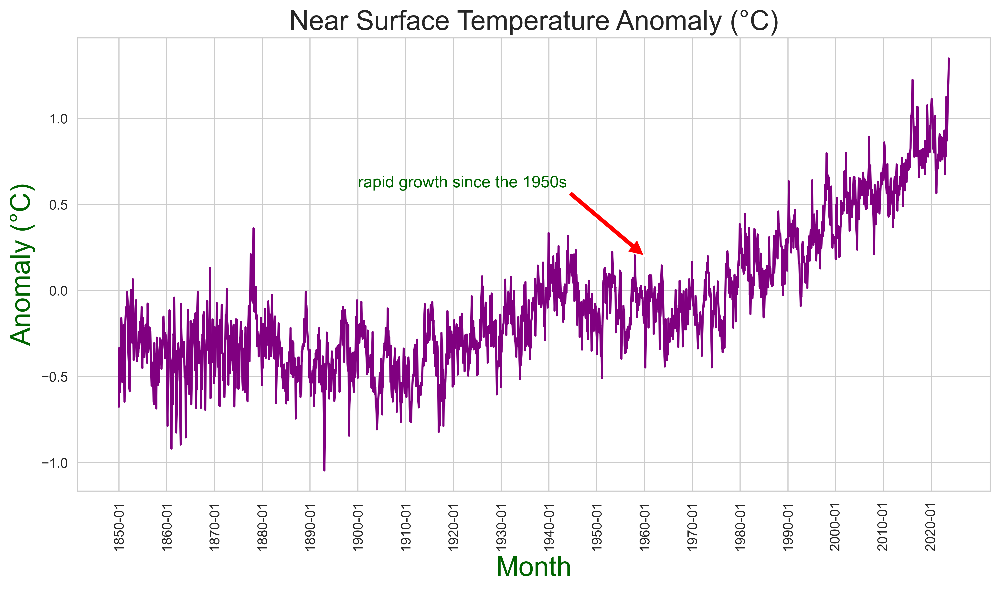

In [407]:
#plot the monthly temperature anomaly
plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_monthly_df['Time'], temperature_monthly_df['Anomaly (deg C)'], color='purple', linewidth=1.5)
#for the x-asis to be readable, we will plot the x-axis every 10 years
plt.xticks(temperature_monthly_df['Time'][::120], rotation=90)
plt.title('Near Surface Temperature Anomaly (°C)', fontsize=20)
plt.xlabel('Month', fontsize=20, color='darkgreen')
plt.ylabel('Anomaly (°C)', fontsize=20, color='darkgreen')
plt.annotate('rapid growth since the 1950s', xy=('1960-01', 0.2), xytext=('1900-01', 0.6), color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));
#plt.annotate('rapid growth since the 1950s', xy=('1960-01-01', 0.2), xytext=('1900-01-01', 0.6), color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));


Text(0, 0.5, 'Anomaly (°C)')

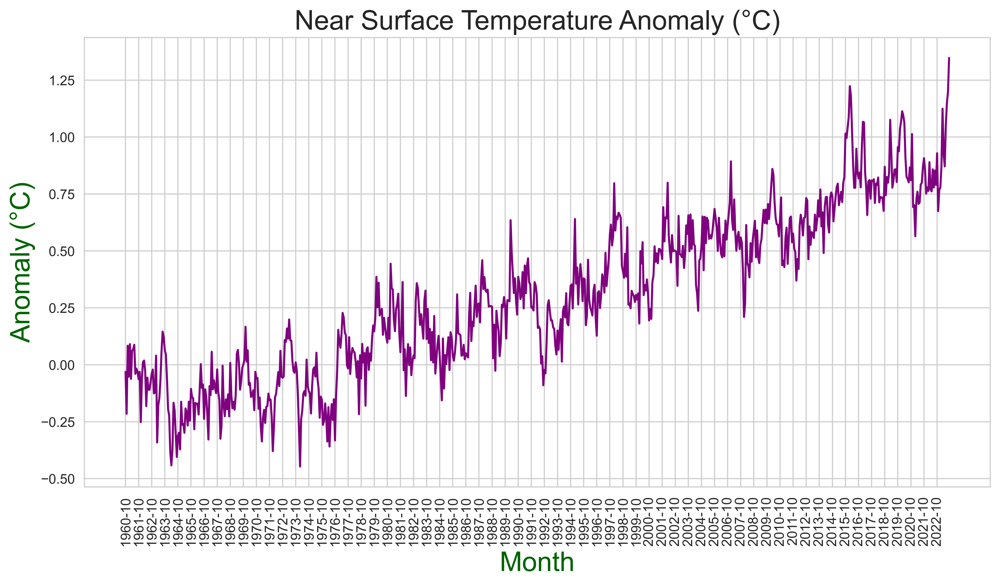

In [408]:
#let's visualize the last 64 years of the monthly temperature anomaly to see the seasonal pattern
plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_monthly_df['Time'][-756:], temperature_monthly_df['Anomaly (deg C)'][-756:], color='purple', linewidth=1.5)
plt.xticks(temperature_monthly_df['Time'][-756::12], rotation=90) #
plt.title('Near Surface Temperature Anomaly (°C)', fontsize=20)
plt.xlabel('Month', fontsize=20, color='darkgreen')
plt.ylabel('Anomaly (°C)', fontsize=20, color='darkgreen')
#plt.annotate('rapid growth since the 1950s', xy=('2010-01', 0.2), xytext=('2000-01', 0.6), color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));
#plt.annotate('rapid growth since the 1950s', xy=('2010-01-01', 0.2), xytext=('2000-01-01', 0.6), color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));




<font color="darkgreen">**From the plot, we see a pattern repeat every 12 months and every 4 or 5 years**<font>

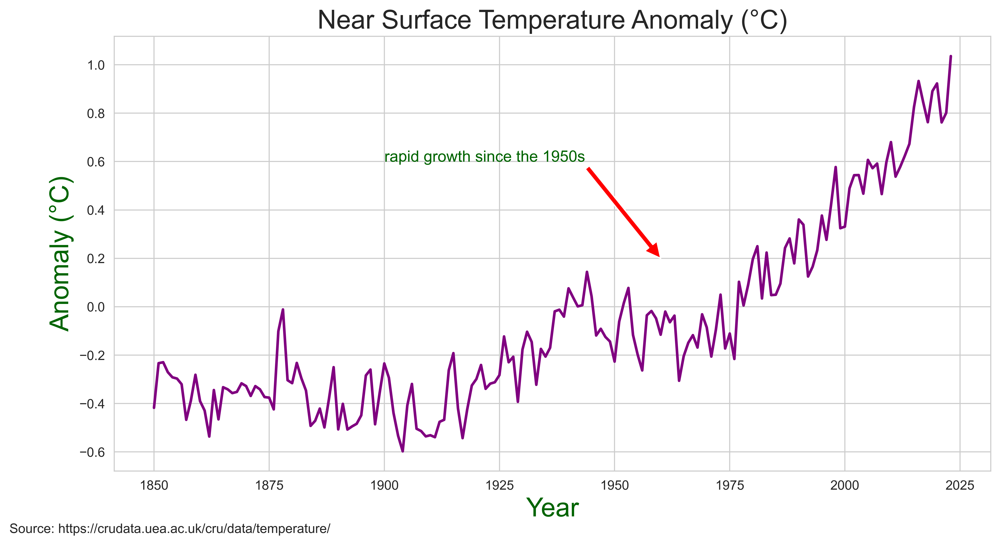

In [409]:
plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_annual_df['Year'], temperature_annual_df['Anomaly'], color='purple', linewidth=2)
plt.title('Near Surface Temperature Anomaly (°C)', fontsize=20)
plt.xlabel('Year', fontsize=20, color='darkgreen')
plt.ylabel('Anomaly (°C)', fontsize=20, color='darkgreen')   
plt.annotate('Source: https://crudata.uea.ac.uk/cru/data/temperature/', (0,0), (-80,-40), fontsize=10, xycoords='axes fraction', textcoords='offset points', va='top')
plt.annotate('rapid growth since the 1950s', xy=(1960, 0.2), xytext=(1900, 0.6), 
             color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));

<font color=darkgreen>**It is obvious from the above plot that there has been a rapid growth in temperature since the 1950s**<font>

## Carbon dioxide ($CO_2$) concentration
Data Source: World in Data


In [121]:
CO2_df=pd.read_csv('co2/Monthly_co2/annual-co2-emissions-per-country.csv').drop('Code',axis=1)
CO2_df=CO2_df[CO2_df['Year']>=1850]
CO2_df.info()
CO2_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27434 entries, 0 to 31348
Data columns (total 3 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Entity                27434 non-null  object 
 1   Year                  27434 non-null  int64  
 2   Annual CO₂ emissions  27434 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 857.3+ KB


,Entity,Year,Annual CO₂ emissions
0,Afghanistan,1949,14656.0
1,Afghanistan,1950,84272.0
2,Afghanistan,1951,91600.0
3,Afghanistan,1952,91600.0
4,Afghanistan,1953,106256.0


In [122]:
# Grouping the data by 'Year' and summing up the emissions
grouped_co2_df = CO2_df.groupby('Year').sum()

# Drop unnecessary columns, rename columns, and view
grouped_co2_df = grouped_co2_df.drop(columns=['Entity'], errors='ignore')
grouped_co2_df.reset_index(inplace=True)
grouped_co2_df.rename({'Year':'year', 'Annual CO₂ emissions':'total_emissions'}, axis=1, inplace=True)

grouped_co2_df.head()

,year,total_emissions
0,1850,1.589699e+09
1,1851,1.598402e+09
2,1852,1.671026e+09
3,1853,1.748428e+09
4,1854,2.056988e+09


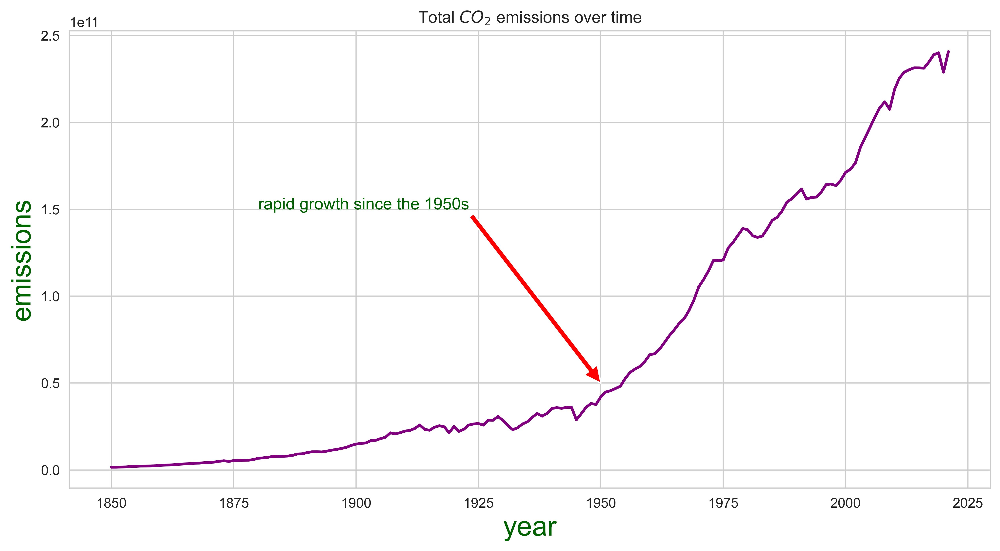

In [411]:
#plot of the time series
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6), dpi=500)
plt.plot(grouped_co2_df['year'], grouped_co2_df['total_emissions'], color='purple', linewidth=2)
plt.title('Total $CO_2$ emissions over time')
plt.xlabel('year', color='darkgreen', fontsize=20)
plt.ylabel('emissions', color='darkgreen', fontsize=20)
plt.annotate('rapid growth since the 1950s', xy=(1950, 0.5e11), xytext=(1880, 1.5e11), 
             color='darkgreen', fontsize=12, arrowprops=dict(facecolor='red'));
plt.show()

**Let's view the evolution of both series over time**

In [199]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.stats import norm

# Filtering the data to the overlapping period (1850 to 2021)
temperature_data_filtered = temperature_annual_df[(temperature_annual_df['Year'] >= 1850) & (temperature_annual_df['Year'] <= 2021)]
co2_data_filtered = grouped_co2_df[(grouped_co2_df['year'] >= 1850) & (grouped_co2_df['year'] <= 2021)]

#let's calculate the correlation between the temperature anomaly and the CO2 emissions
merged_data = pd.merge(temperature_data_filtered[['Year', 'Anomaly']], co2_data_filtered[['year', 'total_emissions']], left_on='Year', right_on='year') #aligning the data
correlation_coefficient, p_value = pearsonr(merged_data['Anomaly'], merged_data['total_emissions'])

#confidence interval
n = merged_data.shape[0]

#transform the correlation coefficient to a Fisher's z-score
z = np.arctanh(correlation_coefficient)

#standard error
se = 1/np.sqrt(n-3)

#95% confidence interval in the z-space
z_critical = norm.ppf(0.975) #0.975 is the 97.5 percentile of the normal distribution
conf_interval_z = (z - z_critical*se, z + z_critical*se)

#transform the confidence interval back to the correlation coefficient space
conf_interval = (np.tanh(conf_interval_z[0]), np.tanh(conf_interval_z[1]))


# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6), dpi=1500)

# Temperature anomaly
ax1.set_xlabel('Year')
ax1.set_ylabel('Temperature Anomaly (°C)', color='tab:red', fontsize=20)
ax1.plot(temperature_data_filtered['Year'], temperature_data_filtered['Anomaly'], color='tab:red', label='Temperature Anomaly', linewidth=2)
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.grid(False)
# CO2 emissions
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('$CO_2$ Emissions (total)', color='tab:blue', fontsize=20)  # we already handled the x-label with ax1
ax2.plot(co2_data_filtered['year'], co2_data_filtered['total_emissions'], color='tab:blue', label='CO2 Emissions', linewidth=2)
ax2.tick_params(axis='y', labelcolor='tab:blue')
ax2.grid(False)
# Title and legend
plt.title('Temperature Anomaly and $CO_2$ Emissions Over Time (1850 - 2021)', fontsize=20)
fig.tight_layout()  # to ensure the right y-label is not slightly clipped

# Formatting the correlation coefficient and confidence interval as percentages
correlation_percentage = correlation_coefficient * 100
ci_lower_percentage = conf_interval[0] * 100
ci_upper_percentage = conf_interval[1] * 100

# Annotations
annotation_text = (f"Correlation: {correlation_percentage:.1f}%\n"
                   f"P-value: {p_value:.2e}\n"
                   f"95% CI: [{ci_lower_percentage:.1f}%, {ci_upper_percentage:.1f}%]")

# Place the annotation at the bottom of the plot
ax1.annotate(annotation_text, xy=(0.82, 0.03), xycoords='axes fraction', fontsize=10,
             bbox=dict(boxstyle="round,pad=0.5", fc="yellow", ec="black", lw=2))

plt.show()


<font color='darkgreen' >**The graph shows the evolution of $CO_2$ emissions and temperature change between 1850 and 2021. The statistical correlation show that there is a high positive correlation between total $CO_2$ emissions and temperature change. It is worth mentioning that correleration does not imply causation as there might be other factors influencing both series or complex interactions at play. More on this later.**<font>

## Test for stationarity

In [220]:
# Defining the functions for the analysis

#Dickey-Fuller test report
def adf_test(series, title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(), autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic', 'p-value', '# lags used', '# observations']
    out = pd.Series(result[0:4], index=labels)
    
    for key,val in result[4].items():
        out[f'critical value ({key})']=val
    
    print(f'{out.to_string()}\n')          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

### Stationarity test for Temperature Anomaly (1959 - 2023)

Given that the last 64 years since the onset of the third industrial revolution have shown almost linear trend in the growth of global temperature, we should evaluate the stationarity of the temperature in this period. ie. 1959 - 2023. This period is also very relevant to current discussions on climate change, as it encompasses the era when human-induced climate change became more pronounced.

In [208]:
#recent 64 years temperature anomaly starting from 1959
temperature_ann_1959 = temperature_annual_df[temperature_annual_df.Year >= 1959]
#let's select the columns we need for the analysis i.e. Anomaly and Year
temperature_ann_1959 = temperature_ann_1959[['Year', 'Anomaly']]
temperature_ann_1959.head()


,Year,Anomaly
Date,,
1959,1959,-0.048005
1960,1960,-0.115487
1961,1961,-0.019997
1962,1962,-0.064054
1963,1963,-0.036806


In [219]:
adf_test(temperature_ann_1959['Anomaly'], title='Temperature Anomaly')

Augmented Dickey-Fuller Test: Temperature Anomaly
ADF test statistic       1.439009
p-value                  0.997284
# lags used              9.000000
# observations          55.000000
critical value (1%)     -3.555273
critical value (5%)     -2.915731
critical value (10%)    -2.595670

Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


<font color = 'darkgreen'>**The test statistic is greater than the critical value at 5% significance level. Therefore, we fail to reject the null hypothesis. We differnce the series to ensure stationarity**<font>

**Difference the series and test again:**

In [273]:
#let's difference the data to make it stationary
temperature_ann_1959_diff = temperature_ann_1959['Anomaly'].diff()[1:] #we drop the first value because it is NaN
temperature_ann_1959_diff.head()


Date
1960   -0.067482
1961    0.095490
1962   -0.044057
1963    0.027249
1964   -0.269061
Name: Anomaly, dtype: float64

In [214]:
#perform the dickey fuller test on the differenced data
adf_test(temperature_ann_1959_diff, title='Differenced Temperature Anomaly')

Augmented Dickey-Fuller Test: Differenced Temperature Anomaly
ADF test statistic      -4.401148
p-value                  0.000295
# lags used              8.000000
# observations          55.000000
critical value (1%)     -3.555273
critical value (5%)     -2.915731
critical value (10%)    -2.595670

Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


<font color='darkorange'>**Here we can see that the p-value is less than 0.05. Also, the ADF test statistic is less than the critical value at 1%, 5% and 10% confidence intervals. This means that we can reject the null hypothesis and conclude that the data is stationary. First order differencing makes the recent 64 years series stationary**<font>

### Stationarity Test for Temperature Anomaly (1850 - 2023)


In [217]:
adf_test(temperature_annual_df['Anomaly'], title='Temperature Anomaly: 1850 - 2023')

Augmented Dickey-Fuller Test: Temperature Anomaly: 1850 - 2023
ADF test statistic        2.080479
p-value                   0.998769
# lags used               7.000000
# observations          166.000000
critical value (1%)      -3.470370
critical value (5%)      -2.879114
critical value (10%)     -2.576139

Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


**The temperature anomaly is not stationary. Let's difference the data to make it stationary.:**

In [218]:
#difference the series
temperature_annual_df_diff = temperature_annual_df['Anomaly'].diff()[1:]

#perform the dickey fuller test on the differenced data
adf_test(temperature_annual_df_diff, title='Differenced Temperature Anomaly: 1850 - 2023')


Augmented Dickey-Fuller Test: Differenced Temperature Anomaly: 1850 - 2023
ADF test statistic     -8.430856e+00
p-value                 1.871897e-13
# lags used             4.000000e+00
# observations          1.680000e+02
critical value (1%)    -3.469886e+00
critical value (5%)    -2.878903e+00
critical value (10%)   -2.576027e+00

Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


<font color='darkorange'>**Clearly, first order differencing was enough to make the data stationary.**<font>

### Stationarity of the Monthly temperature anomaly

In [221]:
#stationarity test of the monthly temperature anomaly
adf_test(temperature_monthly_df['Anomaly (deg C)'], title='Temperature Anomaly: 1850 - 2023')

Augmented Dickey-Fuller Test: Temperature Anomaly: 1850 - 2023
ADF test statistic        -0.093898
p-value                    0.950043
# lags used               23.000000
# observations          2061.000000
critical value (1%)       -3.433527
critical value (5%)       -2.862943
critical value (10%)      -2.567517

Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


Augmented Dickey-Fuller Test: Differenced Temperature Anomaly: 1850 - 2023
ADF test statistic     -1.569872e+01
p-value                 1.404687e-28
# lags used             2.200000e+01
# observations          2.061000e+03
critical value (1%)    -3.433527e+00
critical value (5%)    -2.862943e+00
critical value (10%)   -2.567517e+00

Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


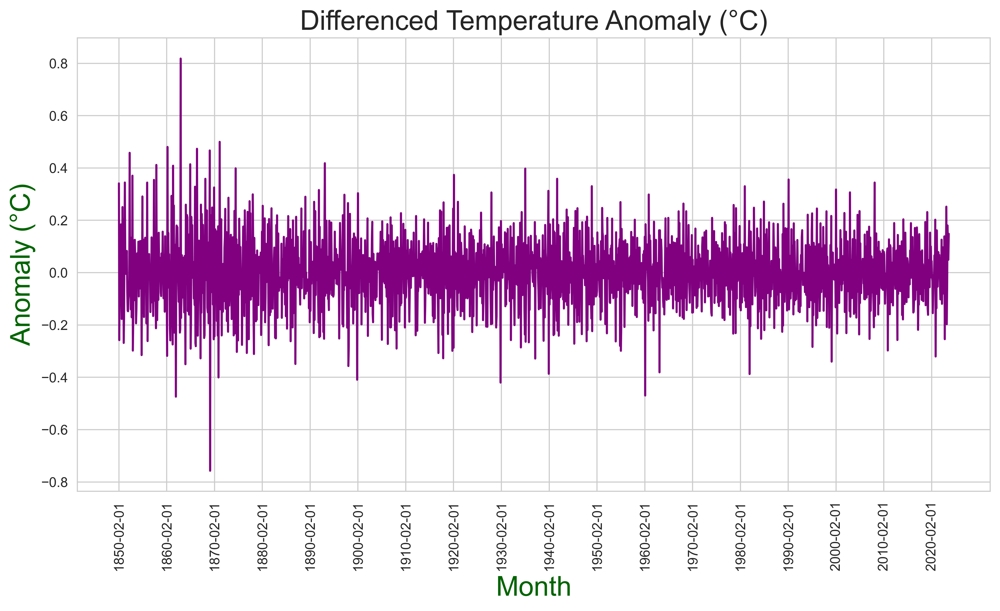

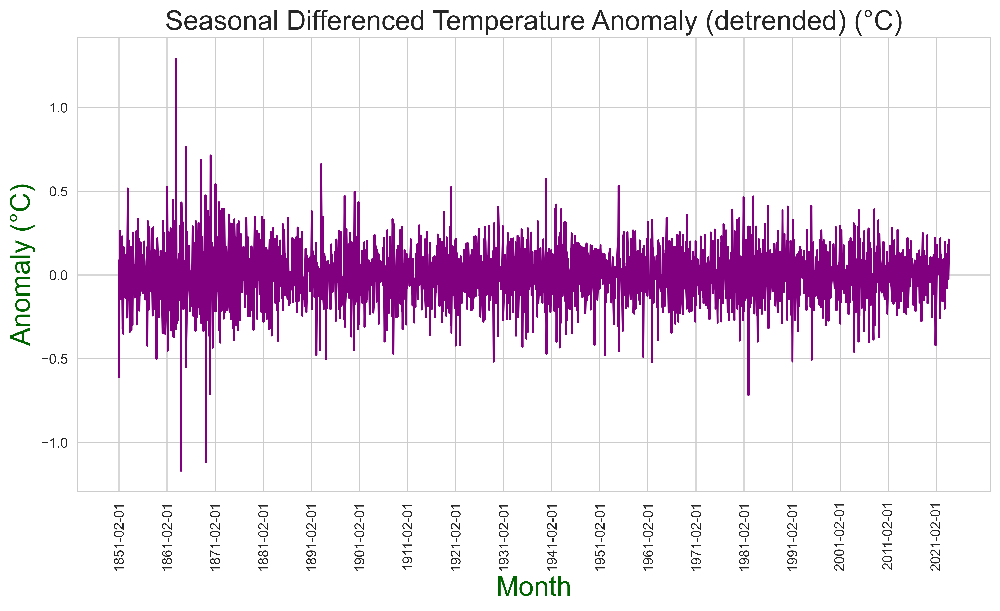

In [413]:
#difference the series
temperature_monthly_df_diff = temperature_monthly_df['Anomaly (deg C)'].diff()[1:]
#seasonal difference
temperature_monthly_df_seadiff = temperature_monthly_df_diff.diff(12)[12:]

#plot the ordinary differenced data
plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_monthly_df_diff, color='purple', linewidth=1.5)
plt.xticks(temperature_monthly_df_diff.index[::120], rotation=90)
plt.title('Differenced Temperature Anomaly (°C)', fontsize=20)
plt.xlabel('Month', fontsize=20, color='darkgreen')
plt.ylabel('Anomaly (°C)', fontsize=20, color='darkgreen')

#plot the seasonal differenced data
plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_monthly_df_seadiff, color='purple', linewidth=1.5)
plt.xticks(temperature_monthly_df_seadiff.index[::120], rotation=90) # meaning show ticks for every 10 years
plt.title('Seasonal Differenced Temperature Anomaly (detrended) (°C)', fontsize=20)
plt.xlabel('Month', fontsize=20, color='darkgreen')
plt.ylabel('Anomaly (°C)', fontsize=20, color='darkgreen')

#perform the dickey fuller test on the differenced data
adf_test(temperature_monthly_df_diff, title='Differenced Temperature Anomaly: 1850 - 2023')

### Stationarity of the post-1959 monthly temperature anomaly

In [224]:
temperature_monthly_1959 = temperature_monthly_df[temperature_monthly_df.index >= '1959-01-01']
adf_test(temperature_monthly_1959['Anomaly (deg C)'], title='Temperature Anomaly: 1959 - 2023')

Augmented Dickey-Fuller Test: Temperature Anomaly: 1959 - 2023
ADF test statistic       -1.393052
p-value                   0.585602
# lags used               4.000000
# observations          772.000000
critical value (1%)      -3.438849
critical value (5%)      -2.865291
critical value (10%)     -2.568767

Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [225]:
#difference the series
temperature_monthly_1959_diff = temperature_monthly_1959['Anomaly (deg C)'].diff()[1:]
adf_test(temperature_monthly_1959_diff, title='Differenced Temperature Anomaly: 1959 - 2023')

Augmented Dickey-Fuller Test: Differenced Temperature Anomaly: 1959 - 2023
ADF test statistic     -9.282712e+00
p-value                 1.238720e-15
# lags used             1.700000e+01
# observations          7.580000e+02
critical value (1%)    -3.439006e+00
critical value (5%)    -2.865361e+00
critical value (10%)   -2.568804e+00

Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


## Autocorrelation and Partial Autocorrelation Plots


In [308]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(data, max_lags, variable, differencing, seasonal_period, seasonal_differencing, title, dpi):
    # Calculate total number of plots needed
    total_plots = differencing + seasonal_differencing + 1
    fig, axs = plt.subplots(total_plots, 2, figsize=(12, 5 * total_plots), dpi=dpi)
    fig.suptitle(title, fontsize=20, color='darkgreen')
    
    # Ensure axs is a 2-D array
    axs = axs if total_plots > 1 else [axs]

    # Ordinary differencing
    for i in range(differencing + 1):
        # Perform ordinary differencing if i is not 0
        data_diff = data if i == 0 else data.diff(i).dropna()

        # Plot ACF
        plot_acf(data_diff, ax=axs[i, 0], lags=max_lags)
        diff_label = f" (differenced^{i})" if i > 0 else ""
        axs[i, 0].set_title(f'ACF {variable}{diff_label}', fontsize=15)

        # Plot PACF
        plot_pacf(data_diff, ax=axs[i, 1], lags=max_lags)
        axs[i, 1].set_title(f'PACF {variable}{diff_label}', fontsize=15)

    # Seasonal differencing
    if seasonal_differencing > 0:
        for j in range(1, seasonal_differencing + 1):
            #if trend is not removed, we will remove it here
            data_diff = data if differencing == 0 else data.diff(differencing).dropna()
            #seasonal differencing
            data_diff = data_diff.diff(periods=seasonal_period * j).dropna()
            #show head of the data
            print(f'Head of the data after seasonal differencing^{j}:')
            print(data_diff.head())
            # Plot ACF for seasonally differenced data
            plot_acf(data_diff, ax=axs[differencing + j, 0], lags=max_lags)
            axs[differencing + j, 0].set_title(f'ACF {variable} (seasonally differenced^{j})', fontsize=15)

            # Plot PACF for seasonally differenced data
            plot_pacf(data_diff, ax=axs[differencing + j, 1], lags=max_lags)
            axs[differencing + j, 1].set_title(f'PACF {variable} (seasonally differenced^{j})', fontsize=15)

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top to accommodate the suptitle
    plt.show()

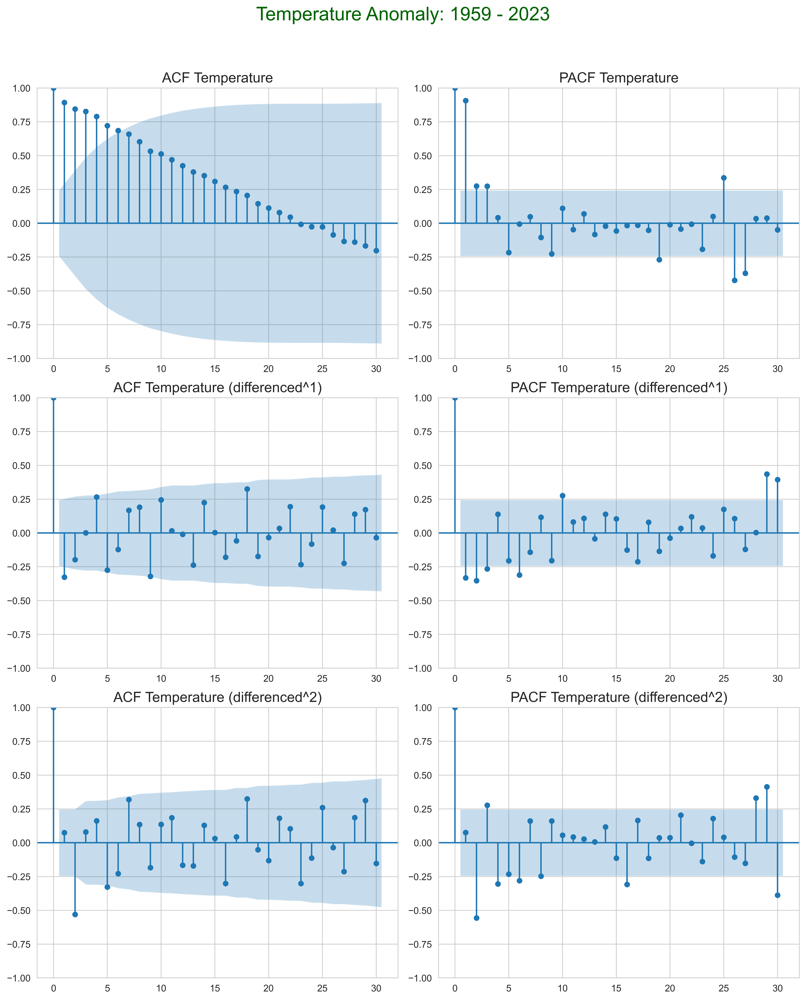

In [414]:
#plotting the ACF and PACF of the recent 64 years temperature anomaly starting from 1959
plot_acf_pacf(
    data=temperature_ann_1959['Anomaly'], 
    max_lags=30, 
    variable='Temperature', 
    differencing=2, 
    seasonal_period=0, 
    seasonal_differencing=0, 
    title='Temperature Anomaly: 1959 - 2023', 
    dpi=500
)



<font color='darkorange'>**Based on the above, we can start with an `ARIMA (3,1,1) and ARIMA (3,2,1)` . We couldn't seasonally difference with 5 years due to the length of the data**<font>

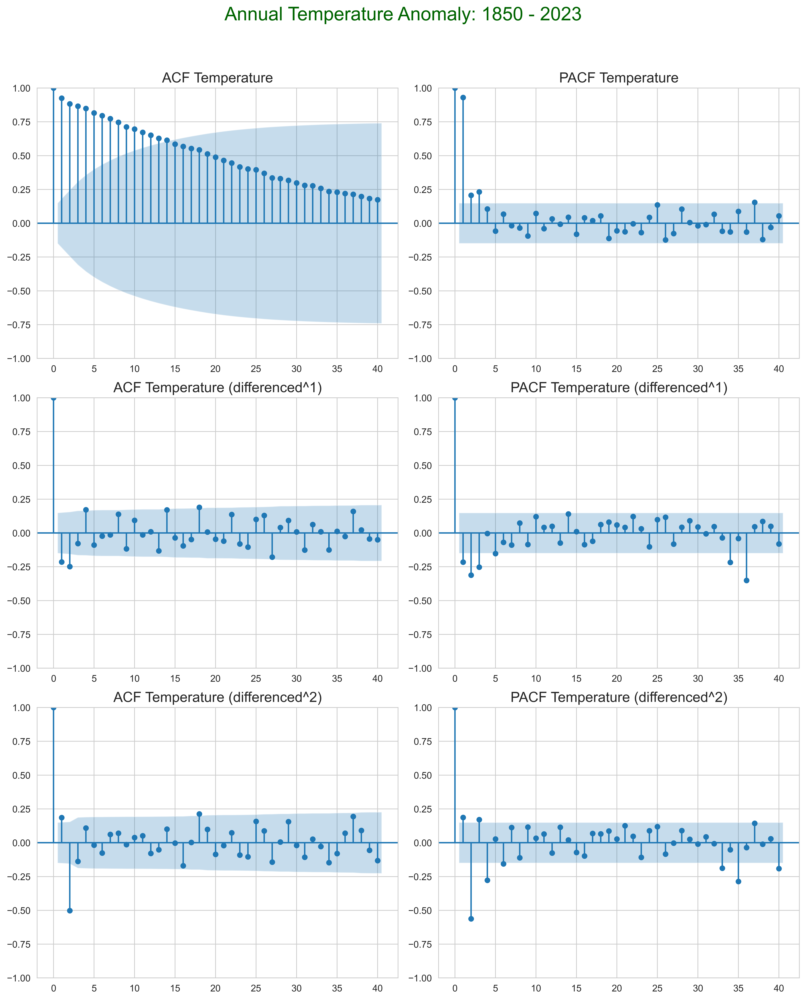

In [455]:
#plotting the ACF and PACF of full annual temperature anomaly ()1850 - 2023)
plot_acf_pacf(
    data=temperature_annual_df['Anomaly'], 
    max_lags=40, 
    variable='Temperature', 
    differencing=2, 
    seasonal_period=0, 
    seasonal_differencing=0, 
    title='Annual Temperature Anomaly: 1850 - 2023', 
    dpi=500
)

**We can start with an `ARIMA (3,1,2) or ARIMA (4,2,2)`**

Head of the data after seasonal differencing^1:
Date
1851-02-01   -0.609741
1851-03-01    0.081186
1851-04-01    0.101319
1851-05-01    0.263974
1851-06-01   -0.103026
Name: Anomaly (deg C), dtype: float64


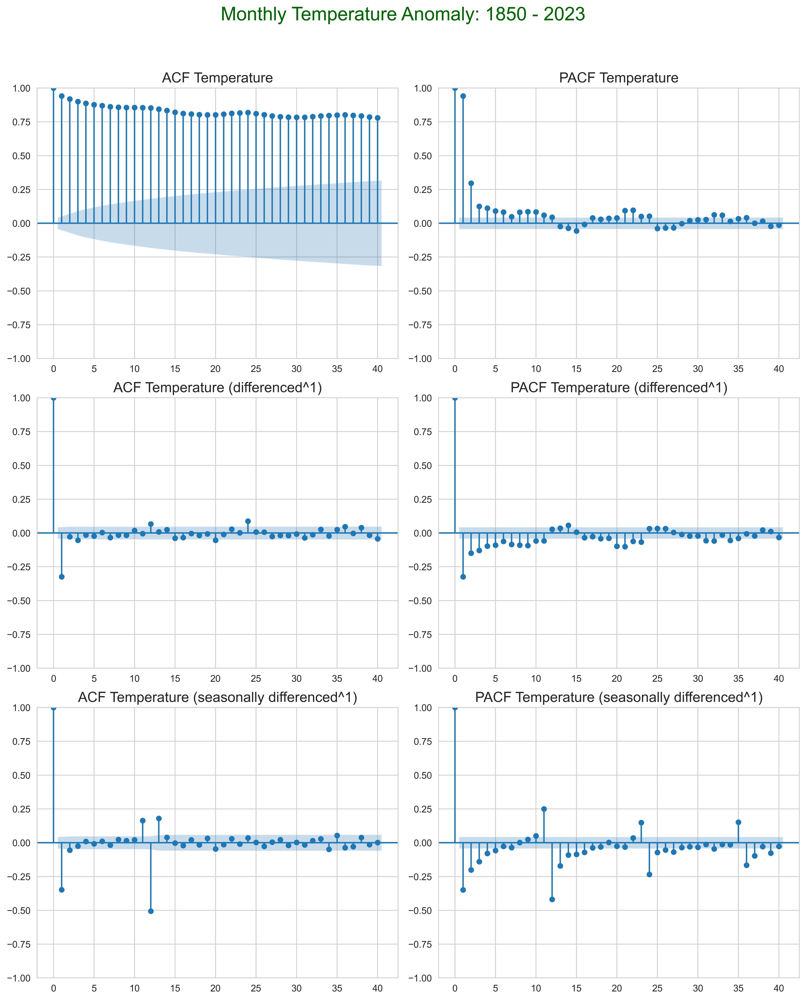

In [416]:
#plotting the ACF and PACF of the monthly temperature anomaly
plot_acf_pacf(
    data=temperature_monthly_df['Anomaly (deg C)'], 
    max_lags=40, 
    variable='Temperature', 
    differencing=1, 
    seasonal_period=12, 
    seasonal_differencing=1, 
    title='Monthly Temperature Anomaly: 1850 - 2023', 
    dpi=500
)

<font color ='darkviolet'>**We can start with an `ARIMA (0,1,1)x(0,1,1)12`**<font>

**Considering the 4 - 5 years cyclical pattern we observed in the data, we could specify a 60-month seasonal period for deseasonalization:**

Head of the data after seasonal differencing^1:
Date
1855-02-01   -0.495401
1855-03-01    0.227341
1855-04-01    0.123210
1855-05-01   -0.250040
1855-06-01   -0.109200
Name: Anomaly (deg C), dtype: float64


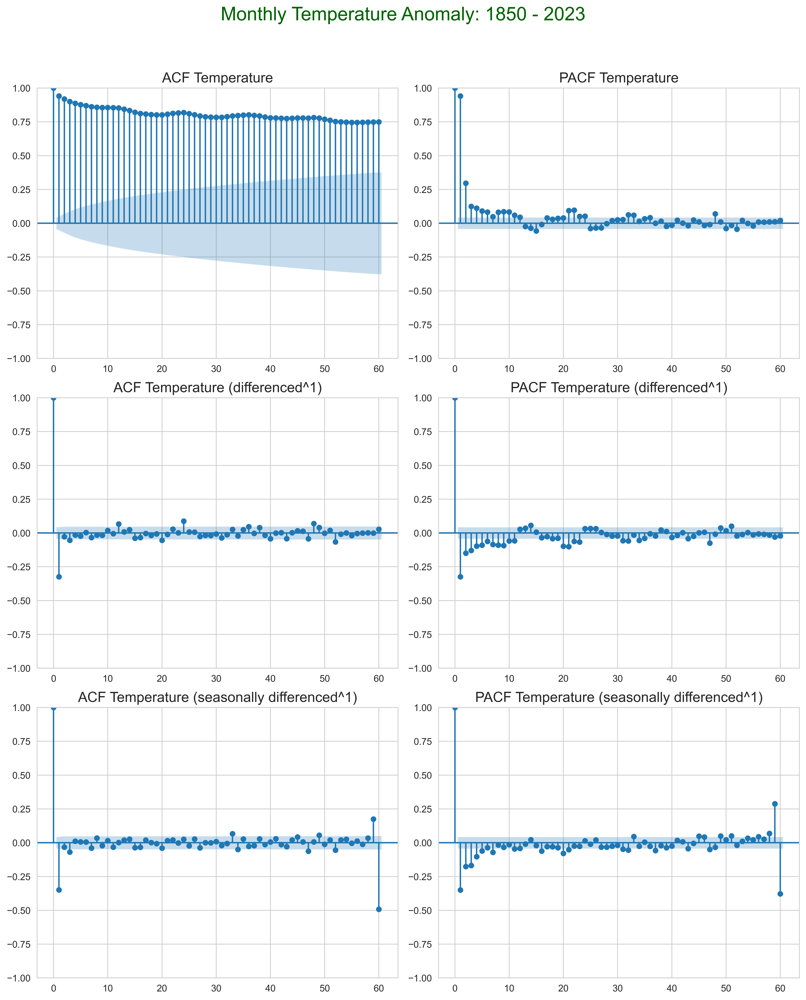

In [417]:
#plotting the ACF and PACF of the monthly temperature anomaly
plot_acf_pacf(
    data=temperature_monthly_df['Anomaly (deg C)'], 
    max_lags=60, 
    variable='Temperature', 
    differencing=1, 
    seasonal_period=60, 
    seasonal_differencing=1, 
    title='Monthly Temperature Anomaly: 1850 - 2023', 
    dpi=500
)

<font color='darkorange'>**Note, the trend was first removed using the differencing order specified before applying the seasonal differencing. It appears that series follows a cyclical pattern of 5 years. Seasonal differencing with a period of 60 months as opposed to 12 months seem to remove the seasonality. Climatic patterns such as certain phases of the El Niño Southern Oscillation (ENSO) might be responsible (3 - 5 years)**<font>

<font color='white'>**Based on the above we can start with an ARIMA model with a seasonal order of `(1,1,1)x(0,1,1)60`**<font>

In [406]:
# ACF and PACF of the monthly temperature anomaly for the last 64 years
plot_acf_pacf(
    data=temperature_monthly_1959['Anomaly (deg C)'], 
    max_lags=120, 
    variable='Temperature', 
    differencing=1, 
    seasonal_period=60, 
    seasonal_differencing=2, 
    title='Monthly Temperature Anomaly: 1959 - 2023', 
    dpi=500
)

Head of the data after seasonal differencing^1:
Date
1964-02-01   -0.009699
1964-03-01   -0.181566
1964-04-01   -0.068380
1964-05-01    0.132148
1964-06-01    0.170936
Name: Anomaly (deg C), dtype: float64
Head of the data after seasonal differencing^2:
Date
1969-02-01   -0.015940
1969-03-01    0.042556
1969-04-01    0.172441
1969-05-01    0.080832
1969-06-01   -0.096322
Name: Anomaly (deg C), dtype: float64


<font color='darkorange'>**It appears the last 64 years temperature anomaly was also affected by a 5 year seasonal pattern. 5-year seasonal differencing appear to fix that. We can infer an ARIMA (1,1,1)x(0,1,1)60**<font>

## Models for the Univariate Series: ARIMA

It is important to take into consideration the concerns with reliability of the pre-1960s temperature measurements due to the crude nature of the equipements used for the observation. For one, the sensors were not as sophisticated and measurements were mostly manual and prone to errors. 

### ARIMA Model for the Annual Temperature Anomaly (recent 64 years)

In [426]:
#split the data into train and test sets, use 80% of the data for training and 20% for testing
#only choose the Anomaly column
temperature_data = temperature_ann_1959[['Anomaly']]
train_size = int(len(temperature_data) * 0.8)
train_y1959, test_y1959 = temperature_data[0:train_size], temperature_data[train_size:len(temperature_data)]


In [444]:
#Let's use the p,d,q values from the ACF and PACF plots to fit the ARIMA model
arima_y1959 = ARIMA(train_y1959, order=(3,2,1)) 
arima_y1959_fit = arima_y1959.fit()
print(arima_y1959_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                Anomaly   No. Observations:                   52
Model:                 ARIMA(3, 2, 1)   Log Likelihood                  37.283
Date:                Sun, 26 Nov 2023   AIC                            -64.566
Time:                        07:16:34   BIC                            -55.006
Sample:                             0   HQIC                           -60.925
                                 - 52                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5810      0.186     -3.131      0.002      -0.945      -0.217
ar.L2         -0.4355      0.179     -2.434      0.015      -0.786      -0.085
ar.L3         -0.2710      0.130     -2.079      0.0

In [445]:
#let's forecast the temperature anomaly for the test size steps ahead
y1959_forecast = arima_y1959_fit.forecast(steps=len(test_y1959))

#let's compute the mean absolute error, mean squared error and the root mean squared error
print(f'Mean Absolute Error: {mean_absolute_error(test_y1959, y1959_forecast)}')
print(f'Mean Squared Error: {mean_squared_error(test_y1959, y1959_forecast)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(test_y1959, y1959_forecast))}')



Mean Absolute Error: 0.09848730826086499
Mean Squared Error: 0.015598157609782356
Root Mean Squared Error: 0.12489258428658748


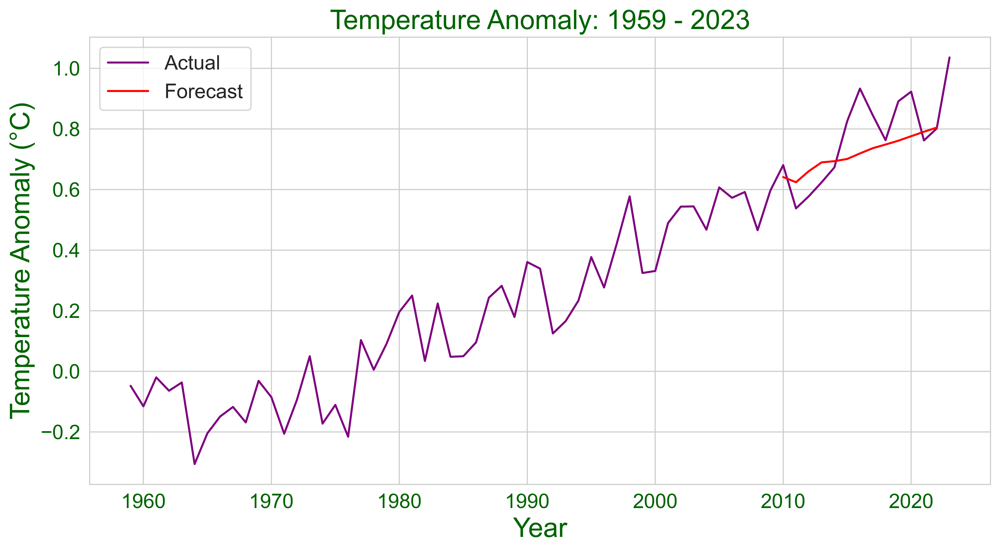

In [446]:
#plot the actual and forecasted values
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_data.index, temperature_data['Anomaly'], color='purple', linewidth=1.5)
plt.plot(range(2010, 2023), y1959_forecast, color='red', linewidth=1.5)
#plt.ylim([-0.6, 1.2])
plt.xlabel('Year', fontsize=20, color='darkgreen')
plt.ylabel('Temperature Anomaly (°C)', fontsize=20, color='darkgreen')
plt.title('Temperature Anomaly: 1959 - 2023', fontsize=20, color='darkgreen')
plt.xticks(fontsize=15, color='darkgreen')
plt.yticks(fontsize=15, color='darkgreen')
plt.legend(['Actual', 'Forecast'], loc='upper left', fontsize=15)
plt.show()


**The forecast is fair but not the best we can get.**

In [425]:
# The ARIMA model is not able to capture the trend in the data. Let's try the SARIMA model
#Use the same split as before
#split the data into train and test sets, use 80% of the data for training and 20% for testing
#only choose the Anomaly column
#import sarimax
# from statsmodels.tsa.statespace.sarimax import SARIMAX
# temperature_data = temperature_ann_1959[['Anomaly']]
# train_size = int(len(temperature_data) * 0.8)
# train_y1959, test_y1959 = temperature_data[0:train_size], temperature_data[train_size:len(temperature_data)]

# #let's use the p,d,q values from the ACF and PACF plots to fit the SARIMA model
# sarima_y1959 = SARIMAX(train_y1959, order=(0,1,1), seasonal_order=(0,1,1,24))
# sarima_y1959_fit = sarima_y1959.fit()
# print(sarima_y1959_fit.summary())

### ARIMA Model for the Annual Temperature Anomaly (1850 - 2023)

In [450]:
#split the data 
temperature_data_full = temperature_annual_df[['Anomaly']]
train_size = int(len(temperature_data_full) * 0.8)
train_yfull, test_yfull = temperature_data_full[0:train_size], temperature_data_full[train_size:len(temperature_data_full)]


In [492]:
#let's fit the ARIMA model
arima_yfull = ARIMA(train_yfull, order=(4,2,2))
arima_yfull_fit = arima_yfull.fit()
print(arima_yfull_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                Anomaly   No. Observations:                  139
Model:                 ARIMA(4, 2, 2)   Log Likelihood                 113.534
Date:                Sun, 26 Nov 2023   AIC                           -213.068
Time:                        08:37:52   BIC                           -192.628
Sample:                             0   HQIC                          -204.761
                                - 139                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1972      0.157     -7.605      0.000      -1.506      -0.889
ar.L2         -0.6155      0.131     -4.708      0.000      -0.872      -0.359
ar.L3         -0.5557      0.143     -3.892      0.0

In [493]:
#let's forecast the temperature anomaly for the test size steps ahead
yfull_forecast = arima_yfull_fit.forecast(steps=len(test_yfull))

#let's compute the mean absolute error, mean squared error and the root mean squared error
print(f'Mean Absolute Error: {mean_absolute_error(test_yfull, yfull_forecast)}')
print(f'Mean Squared Error: {mean_squared_error(test_yfull, yfull_forecast)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(test_yfull, yfull_forecast))}')


Mean Absolute Error: 0.2687745458452298
Mean Squared Error: 0.10109467438160762
Root Mean Squared Error: 0.31795388719373696


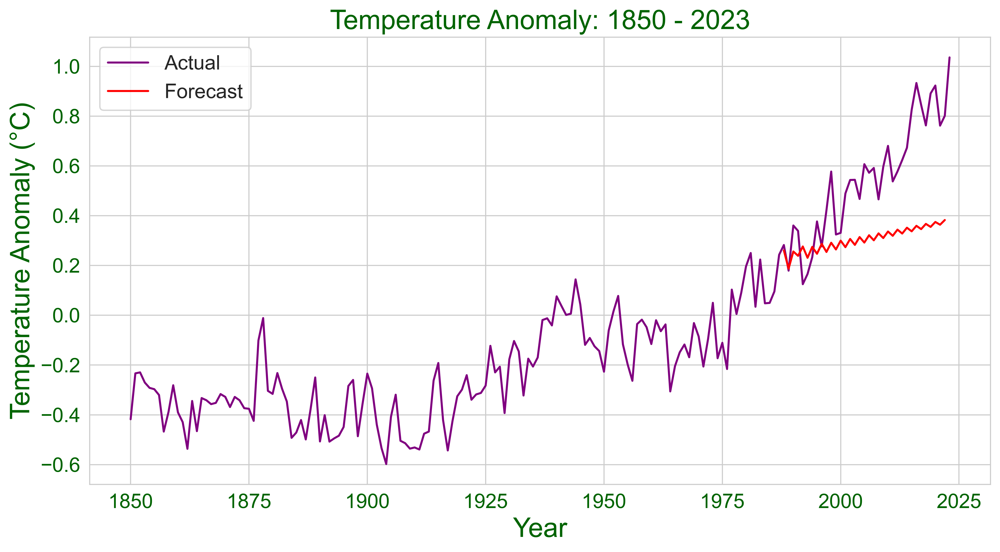

In [494]:
#plot the actual and forecasted values
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_data_full.index, temperature_data_full['Anomaly'], color='purple', linewidth=1.5)
plt.plot(range(1988, 2023), yfull_forecast, color='red', linewidth=1.5)
#plt.ylim([-0.6, 1.2])
plt.xlabel('Year', fontsize=20, color='darkgreen')
plt.ylabel('Temperature Anomaly (°C)', fontsize=20, color='darkgreen')
plt.title('Temperature Anomaly: 1850 - 2023', fontsize=20, color='darkgreen')
plt.xticks(fontsize=15, color='darkgreen')
plt.yticks(fontsize=15, color='darkgreen')
plt.legend(['Actual', 'Forecast'], loc='upper left', fontsize=15)
plt.show()


**It forecasted the trend but the forecasted values are not close to the actual values except for some of the first few years. Let's try to predict a shorter length. In stead of 35 years, we should do a forecast for 20 years or less to see if the prediction improves**

In [499]:
#20 years for the test set
#split the data
temperature_data_full = temperature_annual_df[['Anomaly']]
train_size = int(len(temperature_data_full) * 0.8850574712643678)
train_yfull, test_yfull = temperature_data_full[0:train_size], temperature_data_full[train_size:len(temperature_data_full)]
len(test_yfull)


20

In [500]:
#let's fit the ARIMA model
arima_yfull = ARIMA(train_yfull, order=(4,2,2))
arima_yfull_fit = arima_yfull.fit()
print(arima_yfull_fit.summary())


                               SARIMAX Results                                
Dep. Variable:                Anomaly   No. Observations:                  154
Model:                 ARIMA(4, 2, 2)   Log Likelihood                 123.747
Date:                Sun, 26 Nov 2023   AIC                           -233.493
Time:                        09:55:38   BIC                           -212.326
Sample:                             0   HQIC                          -224.894
                                - 154                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2180      0.164     -7.418      0.000      -1.540      -0.896
ar.L2         -0.6607      0.135     -4.891      0.000      -0.926      -0.396
ar.L3         -0.5543      0.141     -3.925      0.0

In [501]:
#let's forecast the temperature anomaly for the test size steps ahead
yfull_forecast = arima_yfull_fit.forecast(steps=len(test_yfull))

#let's compute the mean absolute error, mean squared error and the root mean squared error
print(f'Mean Absolute Error: {mean_absolute_error(test_yfull, yfull_forecast)}')
print(f'Mean Squared Error: {mean_squared_error(test_yfull, yfull_forecast)}')
print(f'Root Mean Squared Error: {np.sqrt(mean_squared_error(test_yfull, yfull_forecast))}')


Mean Absolute Error: 0.14813804264170255
Mean Squared Error: 0.03558723856743296
Root Mean Squared Error: 0.18864580188128482


**There is an imporovement in the MAE, MSE, and RMSE**

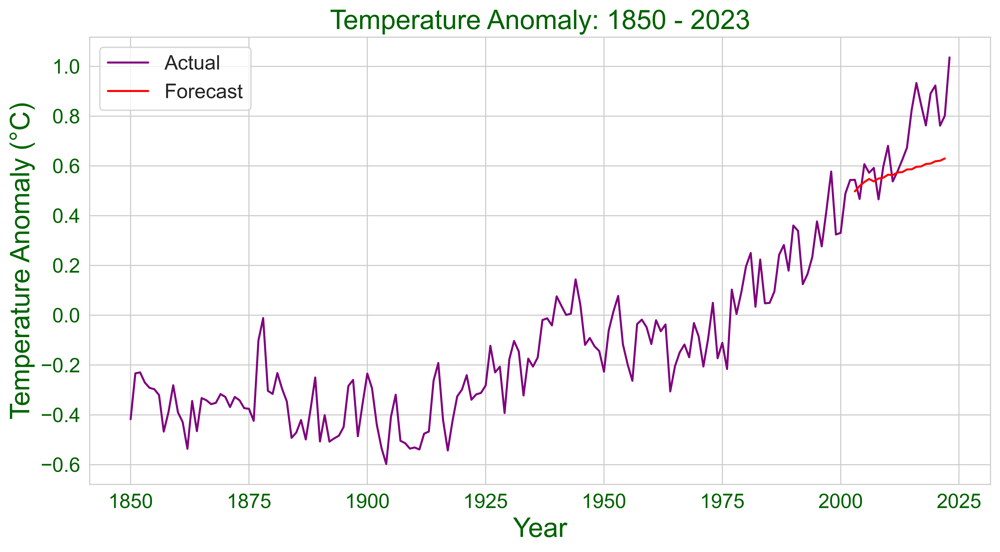

In [502]:
#plot the actual and forecasted values
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6), dpi=500)
plt.plot(temperature_data_full.index, temperature_data_full['Anomaly'], color='purple', linewidth=1.5)
plt.plot(range(2003, 2023), yfull_forecast, color='red', linewidth=1.5)
#plt.ylim([-0.6, 1.2])
plt.xlabel('Year', fontsize=20, color='darkgreen')
plt.ylabel('Temperature Anomaly (°C)', fontsize=20, color='darkgreen')
plt.title('Temperature Anomaly: 1850 - 2023', fontsize=20, color='darkgreen')
plt.xticks(fontsize=15, color='darkgreen')
plt.yticks(fontsize=15, color='darkgreen')
plt.legend(['Actual', 'Forecast'], loc='upper left', fontsize=15)
plt.show()


**As expected, training on more data and forecasting on a shorter length improved the model's performance**